# Valuador Inmobiliario

Este proyecto nace de una necesidad personal.
Hace poco tuve la necesidad de tasar una propiedad y me contacté con un agente inmobiliario para que realice la valuación de la propiedad. No es necesario entrar en detalles, pero el final de la historia es que varias llamadas, mensajes y visitas después, termine sin lo que quería, que era saber a cuanto se podía vender la propiedad.

Fue entonces cuando se me ocurrió que esta podría ser una gran oportunidad para poner a prueba mis conocimientos de Machine Learning y validar si como resultado obtengo algo parecido a los valuadores online que hay disponibles. 

Para obtener el dataset me vino a la mente [Properati](www.properati.com.ar), que es un portal de operaciones inmobiliarias conocido por disponibilizar de manera abierta gran cantidad de datos.

Voy a estructurar este proyecto de esta manera:

1. Definición del proyecto
2. Obtención de los datos 
3. Análisis exploratorio de datos (EDA)
4. Procesamiento y preparación de datos
5. Exploración de modelos
6. Selección de modelo y ajustes
7. Presentación de la solución



## 1. Definición del proyecto

<pre style="color:#CCC;">
🚧 TODO:
<strike>1. Define the objective in business terms.</strike>
2. How will your solution be used?
<strike>3. What are the current solutions/workarounds (if any)?</strike>
<strike>4. How should you frame this problem (supervised/unsupervised, online/offline, etc.)?</strike>
5. How should performance be measured?
6. Is the performance measure aligned with the business objective?
7. What would be the minimum performance needed to reach the business objective?
8. What are comparable problems? Can you reuse experience or tools?
9. Is human expertise available?
10. How would you solve the problem manually?
11. List the assumptions you (or others) have made so far.
12. Verify assumptions if possible.
</pre>

El objetivo del proyecto es construír un modelo que nos permita predecir el valor de venta de determinado inmueble. Para acotar el problema vamos a restringirlo solamente al distrito de la Ciudad Autónoma de Buenos Aires.

Desarrollaremos un modelo de Machine Learning de aprendizaje supervisado. Por el momento será offline, pero sería interesante ver a futuro como llevarlo a un modelo online.

Actualmente existen algunos valuadores online de propiedades como el de [Properati](https://www.properati.com.ar/tools/valuador-propiedades) o el de [Reporte Inmobiliario](https://www.reporteinmobiliario.com/market/valuation/). Me interesaría poder comparar los resultados de estos con el del modelo resultante de este proyecto.

## 2. Obtención de los datos

<pre style="color: silver">
🚧 TODO:

(Automate as much as possible so you can easily get fresh data)

1. <strike>List the data you need and how much you need.</strike>
2. <strike>Find and document where you can get that data.</strike>
3. <strike>Check how much space it will take.</strike>
4. Check legal obligations, and get authorization if necessary.
5. Get access authorizations.
6. Create a workspace (with enough storage space).
7. <strike>Get the data.</strike>
8. <strike>Convert the data to a format you can easily manipulate (without changing the
data itself).</strike>
9. <strike>Ensure sensitive information is deleted or protected (e.g., anonymized).</strike>
10. <strike>Check the size and type of data (time series, sample, geographical, etc.).</strike>
11. Sample a test set, put it aside, and never look at it (no data snooping!)
</pre>

En el sitio de descargas de [Properati](https://www.properati.com.ar/data) se disponibilizan los datos de dos maneras:


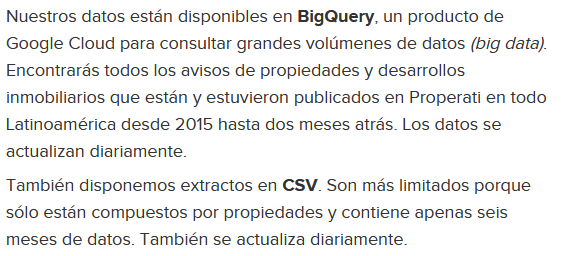


En este caso, vamos a utilizar el extracto en CSV.

Allí mismo contamos con un diccionario donde se definen cada uno de los 25 atributos:

* `id` - Identificador del aviso. No es único: si el aviso es actualizado por la inmobiliaria (nueva versión del aviso) se crea un nuevo registro con la misma id pero distintas fechas: de alta y de baja.
* `start_date` - Fecha de alta del aviso.
* `end_date` - Fecha de baja del aviso.
* `created_on` - Fecha de alta de la primera versión del aviso.



* **place** - Campos referidos a la ubicación de la propiedad o del desarrollo.

    * `lat` - Latitud.
    * `lon` - Longitud.
    * `l1` - Nivel administrativo 1: país.
    * `l2` - Nivel administrativo 2: usualmente provincia.
    * `l3` - Nivel administrativo 3: usualmente ciudad.
    * `l4` - Nivel administrativo 4: usualmente barrio.
    
    
* **property** - Campos relativos a la propiedad (vacío si el aviso es de un desarrollo/proyecto).
    * `rooms` - Cantidad de ambientes (útil en Argentina).
    * `bedrooms` - Cantidad de dormitorios (útil en el resto de los países).
    * `bathrooms` - Cantidad de baños.
    * `surface_total` - Superficie total en m².
    * `surface_covered` - Superficie cubierta en m².
    * `price` - Precio publicado en el anuncio.
    * `currency` - Moneda del precio publicado.
    * `price_period` - Periodo del precio (Diario, Semanal, Mensual)
    * `title` - Título del anuncio.
    * `description` - Descripción del anuncio.
    * `property_type` - Tipo de propiedad (Casa, Departamento, PH).
    * `operation_type` - Tipo de operación (Venta, Alquiler).


### Descargar los datos
Vamos a crear una función que descargue el dataset y lo descomprima en caso de no existir.

In [1]:
import os
import gzip
import shutil
from six.moves import urllib

DOWNLOAD_ROOT = 'https://storage.googleapis.com/properati-data-public/'
FILENAME = 'ar_properties.csv.gz'
DATASET_URL = DOWNLOAD_ROOT + FILENAME
TARGET_PATH = 'datasets'

def fetch_dataset(dataset_url=DATASET_URL, target_path=TARGET_PATH, filename=FILENAME):
    """Función que descarga, descomprime y renombra el dataset en caso de no existir."""
    
    # Si ya existe el dataset en el path destino vuelve sin hacer nada
    if os.path.isfile(os.path.join(target_path, 'housing_dataset.csv')):
        return
    # Si no existe, valida y/o crea el path destino y descarga el dataset
    if not os.path.isdir(target_path):
        os.makedirs(target_path)
    filename_path = os.path.join(target_path, filename)
    urllib.request.urlretrieve(dataset_url, filename_path)
    
    # Descomprime el dataset descargado
    with gzip.open(filename_path, 'rb') as f_in:
        with open(os.path.join(target_path, 'housing_dataset.csv'), 'wb') as f_out:
            shutil.copyfileobj(f_in, f_out)
    
    # Elimina el archivo comprimido
    os.remove(filename_path)

In [2]:
fetch_dataset()

### Un vistazo a los datos

Creamos una función que cargue el dataset en un DataFrame de pandas. Luego damos un primer vistazo al mismo.

In [117]:
import pandas as pd

def load_data(target_path=TARGET_PATH):
    csv_path = os.path.join(target_path, 'housing_dataset.csv')
    return pd.read_csv(csv_path)

In [118]:
housing = load_data()
housing.head()

,id,ad_type,start_date,end_date,created_on,lat,lon,l1,l2,l3,...,bathrooms,surface_total,surface_covered,price,currency,price_period,title,description,property_type,operation_type
0,tQanDoaGOV2IjPfGm+afnw==,Propiedad,2021-01-02,9999-12-31,2021-01-02,-34.03,-53.56,Uruguay,Rocha,NaN,...,NaN,NaN,NaN,20000.00,USD,Mensual,Oportunidad! Terreno en venta en Punta del Di...,Terreno en venta en Punta del Diablo.<br><br>U...,Lote,Venta
1,h7ZRbA/qlmoBg8EpIW9QFQ==,Propiedad,2021-01-02,9999-12-31,2021-01-02,-27.60,-56.68,Argentina,Corrientes,Ituzaingó,...,NaN,NaN,NaN,13000.00,USD,NaN,"TERRENO en el B° COSTARENA, Sta. Tecla, Ituzai...","LOTE DE TERRENO en Barrio COSTARENA, Santa Tec...",Lote,Venta
2,Yu8j5dphUyk/CAMl9MwQJQ==,Propiedad,2021-01-02,9999-12-31,2021-01-02,-39.26,-68.78,Argentina,Neuquén,El Chocón,...,NaN,NaN,NaN,40000.00,USD,NaN,Venta lote Villa El Chocón- Loteo Aguamansa,Venta de Lote Villa El Chocón \nAguamansa es u...,Lote,Venta
3,twRRg0k7jvueRCjy1xwumw==,Propiedad,2021-01-02,2021-01-11,2021-01-02,-24.79,-65.42,Argentina,Salta,NaN,...,1.00,NaN,NaN,6646101.00,ARS,NaN,STYLE MONOAMBIENTES,Un nuevo desarrollo basado en un concepto de v...,Departamento,Venta
4,J8CNuZLxTEcRdj5u6STc7Q==,Propiedad,2021-01-02,2021-03-22,2021-01-02,26.01,-80.15,Estados Unidos,Florida,NaN,...,1.00,82.00,82.00,199900.00,USD,Mensual,Susana Aravena Propiedades-Departamento Hollywood,Inversores: compra sujeta a arrendamiento y re...,Departamento,Venta


Bien, ahora que ya tenemos los datos en un formato fácil de manipular vamos a explorarlos para entender que tenemos y hacernos una idea del trabajo a realizar.

In [88]:
# Configura formato para los datos tipo float con 2 decimales
pd.options.display.float_format = "{:.2f}".format

In [119]:
housing.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000000 entries, 0 to 999999
Data columns (total 25 columns):
 #   Column           Non-Null Count    Dtype  
---  ------           --------------    -----  
 0   id               1000000 non-null  object 
 1   ad_type          1000000 non-null  object 
 2   start_date       1000000 non-null  object 
 3   end_date         1000000 non-null  object 
 4   created_on       1000000 non-null  object 
 5   lat              870034 non-null   float64
 6   lon              869428 non-null   float64
 7   l1               1000000 non-null  object 
 8   l2               1000000 non-null  object 
 9   l3               960086 non-null   object 
 10  l4               271524 non-null   object 
 11  l5               5715 non-null     object 
 12  l6               0 non-null        float64
 13  rooms            609830 non-null   float64
 14  bedrooms         553670 non-null   float64
 15  bathrooms        774920 non-null   float64
 16  surface_total    42

Como podemos ver, el dataset cuenta con 1 millón de registros (m = 1.000.000) y 25 atributos (columnas), 9 de los cuales son numéricos y el resto seguramente sean texto.

Comencemos analizando los atributos de texto.

#### Atributo: id

Se trata de un identificador de la publicación. Podemos comprobar que su valor es único para cada publicación

In [122]:
# Cuenta valores unicos de "id"
housing["id"].nunique()

1000000

#### Atributo: ad_type

En la documentación no hay información del atributos `ad_type`. Veamos que información contiene:

In [123]:
housing['ad_type'].value_counts()

Propiedad    1000000
Name: ad_type, dtype: int64

Como podemos ver, `ad_type` es un atributo categórico, pero solo tiene el valor 'Propiedad' en este extracto, tal como se informa en la documentación. Podemos descartarlo ya que no aporta información.

In [124]:
# Elimina la columna 'ad_type'
housing.drop("ad_type", axis=1, inplace=True)

#### Atributo: operation_type

In [125]:
# Recuenta valores de "operation_type"
housing["operation_type"].value_counts()

Venta                765289
Alquiler             196325
Alquiler temporal     38386
Name: operation_type, dtype: int64

De todos los tipos de operación, sólo nos interesa en este caso contar con las operaciones de venta.

In [126]:
# Conserva solo las operaciones de venta
housing = housing[housing["operation_type"] == "Venta"]

# Elimina la columna "operation_type"
housing.drop("operation_type", axis=1, inplace=True)

#### Atributos: l1 / l2 / l3

Veamos que tenemos en los atributos correspondientes a los niveles administrativos:

In [127]:
# Nivel administrativo l1
housing["l1"].value_counts()

Argentina         755258
Uruguay             9160
Estados Unidos       760
Brasil               111
Name: l1, dtype: int64

In [128]:
# Nivel administrativo l2, filtrando sólo las de Argentina
housing[housing["l1"] == "Argentina"]["l2"].value_counts()

Capital Federal                 168308
Buenos Aires Costa Atlántica    122521
Bs.As. G.B.A. Zona Sur          110753
Bs.As. G.B.A. Zona Norte        109600
Santa Fe                         66989
Bs.As. G.B.A. Zona Oeste         66742
Córdoba                          48933
Buenos Aires Interior            19217
Neuquén                           9508
Mendoza                           6475
Río Negro                         5069
Entre Ríos                        4555
Tucumán                           3650
Misiones                          3117
Salta                             2967
San Luis                          1538
La Pampa                          1077
Corrientes                         740
Chaco                              722
San Juan                           700
Chubut                             678
Jujuy                              490
Santa Cruz                         220
Catamarca                          214
Tierra Del Fuego                   162
Santiago Del Estero      

In [129]:
# Nivel administrativo l3, filtrando Argentina y Capital Federal
housing[(housing["l1"] == "Argentina") & (housing["l2"] == "Capital Federal")]["l3"].value_counts()

Palermo                 23113
Belgrano                13027
Caballito                9594
Villa Crespo             9411
Almagro                  9093
Recoleta                 9033
Villa Urquiza            6159
Flores                   4742
Barrio Norte             4405
Balvanera                4309
Nuñez                    4041
San Nicolás              3794
Colegiales               3184
Villa Devoto             3062
Puerto Madero            2876
Saavedra                 2599
San Telmo                2545
San Cristobal            2469
Villa del Parque         2294
Monserrat                2292
Boedo                    1970
Mataderos                1907
Floresta                 1872
Liniers                  1854
Retiro                   1848
Barracas                 1827
Parque Chacabuco         1704
Villa Luro               1512
Villa Pueyrredón         1355
Chacarita                1323
Congreso                 1224
Paternal                 1197
Parque Patricios         1185
Villa Luga

Si filtramos en `l2` las publicaciones de Capital Federal comprobamos que `l3` contiene el nombre de los barrios porteños. Observamos que existen considerablemente más publicaciones en algunos barrios que en otros.
Vamos a trabajar solo con las publicaciones de Capital Federal para este proyecto, por lo que filtraremos solo esas instancias y descartaremos las columnas `l1` y `l2` que ya no aportan información.

In [130]:
# Conservamos solo las publicaciones de Capital Federal
housing = housing[(housing["l1"] == "Argentina") & (housing["l2"] == "Capital Federal")]

# Eliminamos los atributos l1 y l2
housing.drop(["l1", "l2"], axis=1, inplace=True)

#### Atributos: l5 / l6

In [134]:
housing[["l5", "l6"]].count()

l5    0
l6    0
dtype: int64

No poseen valores, podemos eliminarlos.

In [135]:
# Elimina columnas l5 y l6
housing.drop(["l5", "l6"], axis=1, inplace=True)

#### Atributos: start_date / end_date / created_on

In [136]:
# Imprimo mínimos y máximos para cada atributo
print("start_date >>> min:", housing["start_date"].min(), "- max:", housing["start_date"].max())
print("end_date >>> min:", housing["end_date"].min(), "- max:", housing["end_date"].max())
print("created_on >>> min:", housing["created_on"].min(), "- max:", housing["created_on"].max())

start_date >>> min: 2020-02-29 - max: 2021-03-23
end_date >>> min: 2020-02-29 - max: 9999-12-31
created_on >>> min: 2020-02-29 - max: 2021-03-23


In [137]:
# Máxima fecha válida
housing[housing["end_date"] < '9999-12-31']["end_date"].max()

'2021-05-22'

In [138]:
# Verifico si start_date coincide con created_on en el 100% de los casos
coincidencias = housing[housing["start_date"] != housing["created_on"]].shape[0]
print(f"Número de coincidencias: {coincidencias}")

Número de coincidencias: 0


Aquí podemos observar que, a pesar que en el sitio de descarga se informa que el extracto CSV posee 6 meses de datos, en realidad posee cerca de 12. También comprobamos que las publicaciones finalizadas están actualizadas al día de hoy (2021-05-23) y que las publicaciones con fecha `end_date = '9999-12-31` son las que presumiblemente se encuentran activas a la fecha.

El atributo `created_on` no difiere en ningún caso con `start_date`, por lo tanto no aporta ninguna información adicional y podemos eliminarlo.

In [139]:
# Elimino columna "created_on"
housing.drop("created_on", axis=1, inplace=True)

#### Atributo: property_type

In [140]:
housing["property_type"].value_counts()

Departamento       108787
Otro                19597
PH                  11310
Lote                 6938
Casa                 6851
Local comercial      5996
Oficina              5048
Cochera              2981
Depósito              794
Casa de campo           6
Name: property_type, dtype: int64

Para este proyecto sólo deberíamos utilizar las publicaciones correspondientes a viviendas. Las categorías son bastante descriptivas a excepción de "Otros". Veamos que tipo de publicaciones contiene:

In [141]:
housing[housing["property_type"] == "Otro"][["title","description"]].head(15)

,title,description
2322,Galpón - Caballito,GALPON -BODEGA<br><br>Inmueble de tres plantas...
4607,"La Tablada, galpón 190 m2, Mundo Propiedades","Vnta/Alq, Tablada, z/industrial galpon a estre..."
4962,"Venta local comercial, Villa Lugano",J. FORTUGNO PROPIEDADES VENDELocal sobre Timot...
4963,"Venta local comercial, Villa Lugano",J. FORTUGNO PROPIEDADESSe VENDE local comercia...
5332,"Venta en block sobre lote propio, Villa Lugano",J. FORTUGNO PROPIEDADES VENDECasa subdividida ...
5367,"Venta casa 4 ambientes, Villa Lugano",J. FORTUGNO PROPIEDADES VENDEHermosa casa de 4...
5787,vendo casa de 2 piso y hostel de 7 hah con bañ...,casa de alto y hostel de 7 hah con baño privado
5788,A 5 minutos de Mardelplata Barrio Aurelia,"A 5 minutos de Mardelplata sobre Ruta 2 , Barr..."
7170,VENTA-MONTE CASTRO-DEPOSITO 124m2,"Excelente deposito en forma de ""L"" de 3,90m x ..."
7171,RETASADO Proyecto de importante Estudio de Arq...,1 año de obra para su finalización - Consultar...


Como vemos, hay todo tipo de publicaciones. Galpones, hoteles, locales comerciales, etc. Lo mejor en este caso será descartar estas publicaciones y quedarnos sólo con las de tipo vivienda: Departamento, PH y Casa.

In [142]:
# Filtra las publicaciones de vivienda
tipo_vivienda = ["Departamento", "PH", "Casa"]
housing = housing[housing["property_type"].isin(tipo_vivienda)]

#### Atributo: currency

In [143]:
housing["currency"].value_counts()

USD    123763
ARS       308
Name: currency, dtype: int64

Vemos que hay publicaciones en dos monedas diferentes. Lo usual en el mercado inmobiliario argentino es manejarse en USD para las operaciones de compra/venta de inmuebles, por lo que podríamos actualizar esos pocos registros en ARS diviendo su valor por la cotización del dólar oficial al dia de hoy (aproximadamente 100 ARS = 1 USD).

In [144]:
# Actualiza los registros en ARS a USD
housing.loc[housing["currency"] == "ARS", "price"] = (housing.loc[housing["currency"] == "ARS", "price"].values / 100)

#### Atributo: price_period

In [145]:
housing["price_period"].value_counts()

Mensual    56179
Name: price_period, dtype: int64

Este atributo debería ser útil para las operaciones de tipo Alquiler, no tiene sentido en las operaciones de Venta que vamos a utilizar, por lo que podemos eliminar este atributo que no suma información.

In [146]:
# Elimina columna "price_period"
housing.drop("price_period", axis=1, inplace=True)

#### Atributos: title / description

In [147]:
housing["title"].sample(20)

190278            Depto Villa Gral Mitre 3 amb balcon patio
178721         Casa de 5 ambientes en Venta en Villa crespo
704338                      Venta - Godoy Cruz 2818 8°/9º B
653534    Venta departamento 2 ambientes con balcon al c...
682859    VENTA USD 1.250.000 Torre BELVEDERE gran categ...
51320                               Departamento - Congreso
716401    DEPARTAMENTO VENTA NUÑEZ, 2 AMB + BALCON LUMIN...
404913        Departamento x escalera 2 amb. bajas expensas
229985    Departamento de dos ambientes con patio propio...
511925    Gorriti  3800 1°  - U$D 103.000 - Departamento...
756168    Departamento de 1 ambiente en Venta en Colegiales
594975                                        PH - Floresta
825198    DEPARTAMENTO 3  AMBIENTES - VILLA URQUIZA C/CO...
1596        Departamento de 3 ambientes en Venta en Almagro
244270            Venta depto 2 amb.C/Patio.94 m2.Cañitas!!
834669    Las Casas   4000 1°  - U$D 75.000 - Departamen...
550650                Avenida Santa Fe 3

In [148]:
housing["description"].sample(20)

147812    Torre Gelly<br>Piso muy alto con increíble vis...
204311    3 ambientes amplios edif categoria - PatioEdif...
330015    Lindísimo departamento de 3 ambientes sobre ca...
653645    Oportunidad de Inversión en Pozo. <br><br>Edif...
313100    Venta de Casa 3 AMBIENTES en Liniers, Capital ...
936520    Venta de Departamento 1 AMBIENTE en Recoleta, ...
4364      Emprendimiento en construcción en Belgrano.<br...
19159     Venta de Departamento hermoso 3 AMBIENTES en C...
539582    Venta de Departamento 3 AMBIENTES en Flores, C...
281910    Venta de Departamento 1 AMBIENTE en Recoleta, ...
702272    Hermosa PB de 2 ambientes con patio totalmente...
193994    Venta de Departamento 3 AMBIENTES en Villa Cre...
322252    Corredor Responsable: MARIANO AUFSEHER - CPI 4...
847819    Corredor Responsable: Pamela Suárez - CPI 5334...
257340    4 dormitorios con escritorio en Av. del Libert...
579429    OPORTUNIDAD Hermoso duplex en contrafrente vis...
171867    A estrenar . Apto Profesional.

Se trata del título y la descripción de la publicación que vemos al navegar en el portal inmobiliario. La mayor parte de la información que contiene ya figura en otros atributos, por lo que en principio podríamos descartarlos.

In [149]:
# Elimina columnas "title" y "description"
housing.drop(["title", "description"], axis=1, inplace=True)

Luego de todos los filtros que hemos aplicado, nos quedó el siguiente DataFrame:

In [151]:
housing.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 126948 entries, 118 to 999604
Data columns (total 15 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   id               126948 non-null  object 
 1   start_date       126948 non-null  object 
 2   end_date         126948 non-null  object 
 3   lat              118459 non-null  float64
 4   lon              118433 non-null  float64
 5   l3               125859 non-null  object 
 6   l4               6141 non-null    object 
 7   rooms            121215 non-null  float64
 8   bedrooms         104172 non-null  float64
 9   bathrooms        121294 non-null  float64
 10  surface_total    97944 non-null   float64
 11  surface_covered  99345 non-null   float64
 12  price            124341 non-null  float64
 13  currency         124071 non-null  object 
 14  property_type    126948 non-null  object 
dtypes: float64(8), object(7)
memory usage: 15.5+ MB


#### Atributos numéricos

Analicemos ahora los atributos numéricos:

In [111]:
housing.describe()

,lat,lon,rooms,bedrooms,bathrooms,surface_total,surface_covered,price
count,118459.00,118433.00,121215.00,104172.00,121294.00,97944.00,99345.00,124341.00
mean,-34.59,-58.46,2.73,2.01,1.53,121.82,100.67,245705.62
std,0.34,0.47,1.40,1.53,0.89,1123.03,1137.52,337998.31
min,-53.79,-81.81,1.00,-1.00,1.00,10.00,1.00,0.00
25%,-34.61,-58.46,2.00,1.00,1.00,45.00,40.00,105000.00
50%,-34.60,-58.44,3.00,2.00,1.00,66.00,59.00,155000.00
75%,-34.58,-58.41,4.00,3.00,2.00,108.00,93.00,255000.00
max,26.22,-5.49,35.00,153.00,18.00,140380.00,170000.00,21400000.00


Podemos observar que existen valores nulos en todos los atributos, ya que todos tienen "counts" por debajo de 126948, que es la cantidad de registros del dataset resultante.

Llaman la atención también otros atributos con valores extremos o ilógicos, como por ejemplo en `bedrooms` con un mínimo de -1 y un máximo de 153, o en `surface_total` con valores entre 10 y 140380. Claramente los valores negativos son errores y los valores mínimos y máximos son extremadamente improbables. 

Grafiquemos un histograma por cada atributo numérico y observemos su distribución.

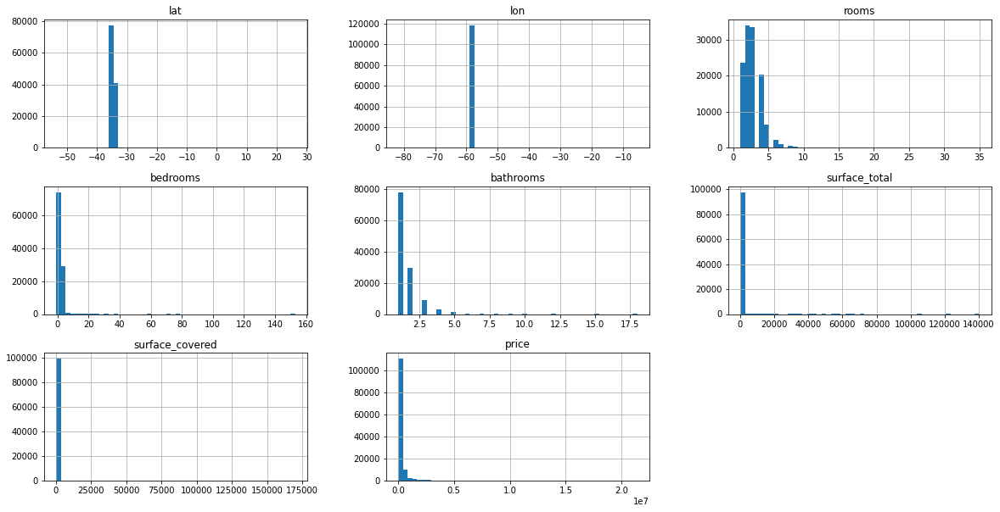

In [153]:
%matplotlib inline
import matplotlib.pyplot as plt

housing.hist(bins=50, figsize=(20, 10))
plt.show()

Observamos que todos los histogramas se extienden más hacia la derecha de la media que a la izquierda. Esto provoca que sea un poco más difícil para algunos algoritmos encontrar patrones. Nos encargaremos más adelante de transformar estos atributos para tener distribuciones con formas más similares a una campana.

Antes de continuar observando el dataset, es recomendable realizar la separación de una parte del conjunto de datos y reservarlo en un conjunto de pruebas o *test_set*. Esto se suele realizar para mitigar sesgos producidos al reconocer patrones en los datos durante la observación de los mismos. Este fenómeno se conoce como "*data snooping bias*" o "*sesgo de espionaje de datos*.

### Dividimos el dataset en Train / Test

Para la división, utilizaremos la función `train_test_split` incluída en Scikit-Learn, con un ratio del 20% para el set de pruebas.

In [154]:
from sklearn.model_selection import train_test_split

train_set, test_set = train_test_split(housing, test_size=0.2, random_state=42)
print(len(train_set), "train + ", len(test_set), "test")

101558 train +  25390 test


### 🚧 TODO: 

<font color='red'>Chequear si existe algún atributo predominante que justifique crear un split estratificado</font>

## 3. Análisis Exploratorio de Datos (EDA)

Ahora que ya conocemos un poco el tipo de datos que manipulamos iremos un poco más en profundidad con el análisis de los mismos.

Hacemos una copia del test de entrenamiento para poder manipularlo sin dañarlo.

In [155]:
df = train_set.copy()

Podríamos empezar representando las coordenadas geográficas en un grafico de dispersión.

<AxesSubplot:xlabel='lon', ylabel='lat'>

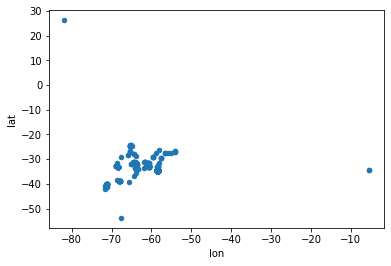

In [157]:
df.plot(kind="scatter", x="lon", y="lat")

En este gráfico deberíamos estar viendo la dispersión de los puntos sobre un área con una forma similar a la del distrito de la Ciudad Autónoma de Buenos Aires. Pareciera ser que hay valores de latitud y longitud que no son válidos para las coordenadas donde se encuentra la Ciudad de Buenos Aires.

Vamos a validar esta información. 

Primero debemos crear un polígono de coordenadas que delimiten la Capital Federal. Para ello voy a utilizar esta herramienta: [Map Polygon/Polyline Tool](https://www.keene.edu/campus/maps/tool/). Grafico el área obtenida sobre un mapa para confirmar que son los límites que deseamos.

In [244]:
import folium
import geojson
import shapely.wkt as wkt
from shapely.geometry import Polygon, Point
from branca.element import Figure

# Container para el mapa
fig = Figure(width=960, height=540)

# Coordenadas CABA
BA_COORDS = [-34.6131500, -58.45]

# Creo el Polygon que encierra a CABA
POLY_COORDS = [
    [-58.3356857, -34.6340554],
    [-58.3356857, -34.6332079],
    [-58.3590317, -34.5795178],
    [-58.4534454, -34.5303184],
    [-58.4682083, -34.5342781],
    [-58.4984207, -34.5489837],
    [-58.5320663, -34.6176696],
    [-58.5276031, -34.6543918],
    [-58.4603119, -34.7063401],
    [-58.4259796, -34.6625815],
    [-58.4136200, -34.6594752],
    [-58.3937073, -34.6628639],
    [-58.3683014, -34.6558039],
    [-58.3576584, -34.6428120],
    [-58.3511353, -34.6351853],
    [-58.3356857, -34.6340554]
]

polyBA_shapely = Polygon(POLY_COORDS)

# Creo el geojson del polygon
g1 = wkt.loads(polyBA_shapely.wkt)
g2 = geojson.Feature(geometry=g1)

# Creo el mapa con el Polygon
map1 = folium.Map(location=BA_COORDS, zoom_start=11, tiles='cartodbpositron', scrollWheelZoom=False)

folium.GeoJson(
    g2,
    style_function=lambda feature: {
        'fillColor': '#0080bb',
        'color' : '#0080bb',
        'weight' : 2
    }).add_to(map1)

# Incorporo el mapa al container
fig.add_child(map1)
fig

El polígono parece ser correcto, ahora vamos a validar que publicaciones caen dentro de ese polígono, es decir, que publicaciones poseen coordenadas que realmente estén dentro de la Ciudad de Buenos Aires.

In [248]:
# Agregamos atributo para filtrar coordenadas reales de CABA
df["real_coords"] = df.apply(lambda row: polyBA_shapely.contains(Point(row["lon"], row["lat"])), axis=1)

df["real_coords"].value_counts()

True     94487
False     7071
Name: real_coords, dtype: int64

Observamos que de las 101.558 publicaciones del train_set, 94.487 poseian coordenadas geográficas correspondientes a CABA, mientras que las 7.071 restantes o no poseen esos datos o no corresponden a coordenadas de CABA.

Podemos visualizar esto mismo en el mapa. Vamos a mostrar 20.000 publicaciones aleatorias con coordenadas dentro de CABA.

In [245]:
# Container para el mapa
fig2 = Figure(width=960, height=540)

# Sampleo muestras
sample_coords = df[df["real_coords"]][["lat","lon"]].sample(n=20000).reset_index(drop=True)

# Construyo el mapa
map2 = folium.Map(location=BA_COORD, zoom_start=12, tiles='cartodbpositron', scrollWheelZoom=False)

# Introduzco puntos en el mapa con comprehension list
[folium.CircleMarker(list(sample_coords.iloc[i]), radius=2, stroke=False, fill_color='#0080bb', alpha=0.1).add_to(map2) 
for i in range(len(sample_coords))]

# Muestro el mapa
fig2.add_child(map2)
fig2

Observamos las que no correspondían a CABA:

In [247]:
fig3 = Figure(width=960, height=540)

# Sampleo muestras
sample_coords = df[(df["real_coords"] == False) & (df["lon"].notnull())][["lat","lon"]].reset_index(drop=True)

# Construyo el mapa
map3 = folium.Map(location=BA_COORD, zoom_start=3, tiles='cartodbpositron', scrollWheelZoom=False)

# Introduzco puntos en el mapa con comprehension list
[folium.CircleMarker(list(sample_coords.iloc[i]), radius=2, stroke=False, fill_color='#0080bb', alpha=0.1).add_to(map3) 
for i in range(len(sample_coords))]

# Muestro el mapa
fig3.add_child(map3)
fig3